In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

In [2]:
df =  pd.read_csv('/home/joaopaulo/Desktop/python/DNC/.venv/ data.csv')

In [3]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 08:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


In [4]:
len(df.query("CustomerID == CustomerID")['CustomerID'].unique())

4372

In [5]:
df.dtypes

InvoiceNo       object
StockCode       object
Description     object
Quantity         int64
InvoiceDate     object
UnitPrice      float64
CustomerID     float64
Country         object
dtype: object

In [6]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611121,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


## verificando valores nulos

In [7]:
df['Description'].isna().sum()

1454

In [8]:
df['Quantity'].isna().sum()

0

In [9]:
df['InvoiceDate'].isna().sum()

0

In [10]:
df['UnitPrice'].isna().sum()

0

In [11]:
df['CustomerID'].isna().sum()

135080

In [12]:
df['Country'].isna().sum()

0

In [13]:
df['StockCode'].isna().sum()

0

In [14]:
df[df['UnitPrice'] <= 0]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
622,536414,22139,NaN,56,12/1/2010 11:52,0.0,NaN,United Kingdom
1970,536545,21134,NaN,1,12/1/2010 14:32,0.0,NaN,United Kingdom
1971,536546,22145,NaN,1,12/1/2010 14:33,0.0,NaN,United Kingdom
1972,536547,37509,NaN,1,12/1/2010 14:33,0.0,NaN,United Kingdom
1987,536549,85226A,NaN,1,12/1/2010 14:34,0.0,NaN,United Kingdom
...,...,...,...,...,...,...,...,...
536981,581234,72817,NaN,27,12/8/2011 10:33,0.0,NaN,United Kingdom
538504,581406,46000M,POLYESTER FILLER PAD 45x45cm,240,12/8/2011 13:58,0.0,NaN,United Kingdom
538505,581406,46000S,POLYESTER FILLER PAD 40x40cm,300,12/8/2011 13:58,0.0,NaN,United Kingdom
538554,581408,85175,NaN,20,12/8/2011 14:06,0.0,NaN,United Kingdom


## Dropando linhas de valor menor ou igual a 0 na coluna UnitPrice

In [15]:
df = df.drop(df[df['UnitPrice'] <= 0].index)

## Dropando linhas de valor menor ou igual a 0 na coluna Quantity

In [16]:
df[df['Quantity'] <= 0 ]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
141,C536379,D,Discount,-1,12/1/2010 09:41,27.50,14527.0,United Kingdom
154,C536383,35004C,SET OF 3 COLOURED FLYING DUCKS,-1,12/1/2010 09:49,4.65,15311.0,United Kingdom
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,12/1/2010 10:24,1.65,17548.0,United Kingdom
236,C536391,21984,PACK OF 12 PINK PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
237,C536391,21983,PACK OF 12 BLUE PAISLEY TISSUES,-24,12/1/2010 10:24,0.29,17548.0,United Kingdom
...,...,...,...,...,...,...,...,...
540449,C581490,23144,ZINC T-LIGHT HOLDER STARS SMALL,-11,12/9/2011 09:57,0.83,14397.0,United Kingdom
541541,C581499,M,Manual,-1,12/9/2011 10:28,224.69,15498.0,United Kingdom
541715,C581568,21258,VICTORIAN SEWING BOX LARGE,-5,12/9/2011 11:57,10.95,15311.0,United Kingdom
541716,C581569,84978,HANGING HEART JAR T-LIGHT HOLDER,-1,12/9/2011 11:58,1.25,17315.0,United Kingdom


In [17]:
df = df.drop(df[df['Quantity'] <= 0 ].index)

## Testando e dropando valores NA na coluna CustomerID

In [18]:
df1 = df

In [19]:
customer0_filter = df['CustomerID'] == 0

In [20]:
df.loc[customer0_filter]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country


In [21]:
#df1['CustomerID'].fillna(-1, inplace=True)
df = df.dropna(subset= ['CustomerID'])

In [22]:
customer1_filter = df1['CustomerID'] == -1

In [23]:
df.loc[customer1_filter]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country


In [24]:
df.iloc[61619]

InvoiceNo                  544634
StockCode                   20675
Description    BLUE POLKADOT BOWL
Quantity                        3
InvoiceDate       2/22/2011 11:02
UnitPrice                    1.25
CustomerID                17994.0
Country            United Kingdom
Name: 97472, dtype: object

In [25]:
column_names =  df.columns.to_list()

In [26]:
column_names

['InvoiceNo',
 'StockCode',
 'Description',
 'Quantity',
 'InvoiceDate',
 'UnitPrice',
 'CustomerID',
 'Country']

In [27]:
duplicated_obs = df[df.duplicated(keep=False,subset= ['InvoiceNo',
 'StockCode',
 'Description',
 'Quantity',
 'InvoiceDate',
 'UnitPrice',
 'CustomerID',
 'Country'])]

In [28]:
duplicated_obs

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
485,536409,22111,SCOTTIE DOG HOT WATER BOTTLE,1,12/1/2010 11:45,4.95,17908.0,United Kingdom
489,536409,22866,HAND WARMER SCOTTY DOG DESIGN,1,12/1/2010 11:45,2.10,17908.0,United Kingdom
494,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,12/1/2010 11:45,1.25,17908.0,United Kingdom
517,536409,21866,UNION JACK FLAG LUGGAGE TAG,1,12/1/2010 11:45,1.25,17908.0,United Kingdom
521,536409,22900,SET 2 TEA TOWELS I LOVE LONDON,1,12/1/2010 11:45,2.95,17908.0,United Kingdom
...,...,...,...,...,...,...,...,...
541675,581538,22068,BLACK PIRATE TREASURE CHEST,1,12/9/2011 11:34,0.39,14446.0,United Kingdom
541689,581538,23318,BOX OF 6 MINI VINTAGE CRACKERS,1,12/9/2011 11:34,2.49,14446.0,United Kingdom
541692,581538,22992,REVOLVER WOODEN RULER,1,12/9/2011 11:34,1.95,14446.0,United Kingdom
541699,581538,22694,WICKER STAR,1,12/9/2011 11:34,2.10,14446.0,United Kingdom


## Verificando linhas duplicadas

In [29]:
df = df.drop_duplicates(subset= column_names)

In [30]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 08:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 08:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 08:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 08:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 08:26,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,12/9/2011 12:50,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,12/9/2011 12:50,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,12/9/2011 12:50,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,12/9/2011 12:50,4.15,12680.0,France


## Transformando a coluna InvoiceDate para o formato correto

In [31]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

In [32]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680.0,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680.0,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680.0,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680.0,France


## Transformando a coluna CustomerID para o formato correto

In [33]:
df['CustomerID'] = pd.to_numeric(df['CustomerID'])

In [34]:
df.dtypes

InvoiceNo              object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID            float64
Country                object
dtype: object

In [35]:
df['CustomerID'] = df['CustomerID'].astype(int)

In [36]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom
...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France


## Tratando outliers

In [37]:
unityPrice_quantity_outlier =  df[(df['Quantity'] > 10000) | (df['UnitPrice'] > 5000)]

In [38]:
unityPrice_quantity_outlier

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
61619,541431,23166,MEDIUM CERAMIC TOP STORAGE JAR,74215,2011-01-18 10:01:00,1.04,12346,United Kingdom
173382,551697,POST,POSTAGE,1,2011-05-03 13:46:00,8142.75,16029,United Kingdom
540421,581483,23843,"PAPER CRAFT , LITTLE BIRDIE",80995,2011-12-09 09:15:00,2.08,16446,United Kingdom


In [39]:
df.dtypes

InvoiceNo              object
StockCode              object
Description            object
Quantity                int64
InvoiceDate    datetime64[ns]
UnitPrice             float64
CustomerID              int64
Country                object
dtype: object

In [40]:
df = df.drop(unityPrice_quantity_outlier.index)

## Criando coluna preço total

In [41]:
df['preco_total'] = df['Quantity'] * df['UnitPrice']

In [42]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,preco_total
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,10.20
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,16.60


## Definindo recência

In [43]:
data_ultima_compra = df['InvoiceDate'].max()

# Gráficos 

## 10 países com maior valor de vendas

In [44]:
df_country_quantity = df['Country'].groupby(df['Country']).count()

In [45]:
df_country_quantity = pd.DataFrame(df_country_quantity)

In [46]:
df_country_quantity.columns.to_list()

['Country']

In [47]:
df_country_quantity.dtypes

Country    int64
dtype: object

In [48]:
df_country_quantity

,Country
Country,
Australia,1181
Austria,398
Bahrain,17
Belgium,2031
Brazil,32
Canada,151
Channel Islands,747
Cyprus,603
Czech Republic,25


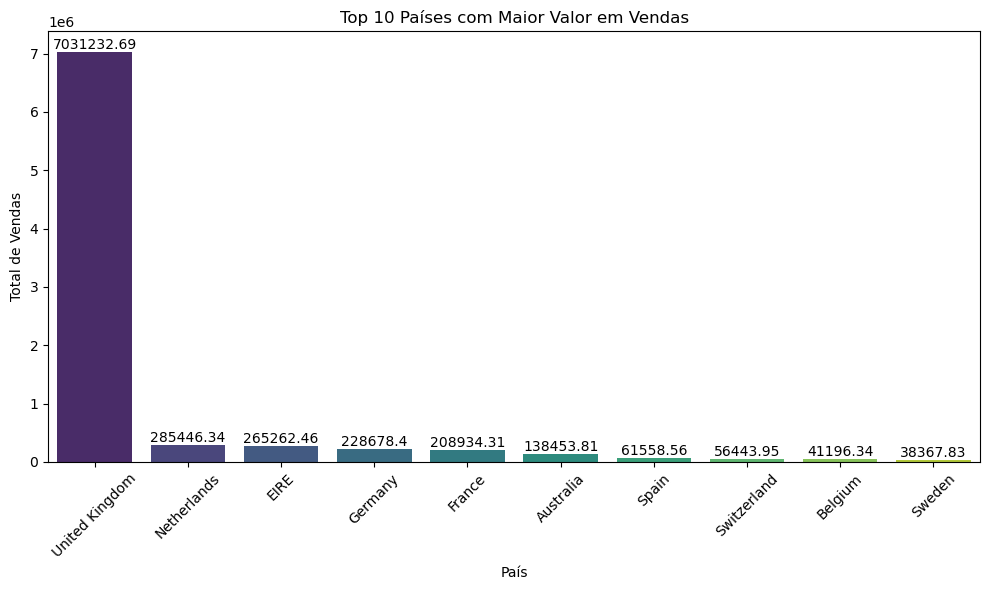

In [49]:
sales_by_country = df.groupby('Country')['preco_total'].sum().reset_index()

top_10_countries = sales_by_country.nlargest(10, 'preco_total')

plt.figure(figsize=(10, 6))
sns.barplot(x='Country', y='preco_total', data=top_10_countries, palette='viridis')

for index, value in enumerate(top_10_countries['preco_total']):
    plt.text(index, value, round(value, 2), ha='center', va='bottom')

plt.xlabel('País')
plt.ylabel('Total de Vendas')
plt.title('Top 10 Países com Maior Valor em Vendas')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## top 10 produtos mais vendidos

In [50]:
most_sold_prod = df.groupby('Description')['Quantity'].sum().reset_index()

In [51]:
most_sold_prod

,Description,Quantity
0,10 COLOUR SPACEBOY PEN,6267
1,12 COLOURED PARTY BALLOONS,2089
2,12 DAISY PEGS IN WOOD BOX,322
3,12 EGG HOUSE PAINTED WOOD,111
4,12 HANGING EGGS HAND PAINTED,40
...,...,...
3860,ZINC T-LIGHT HOLDER STARS SMALL,4894
3861,ZINC TOP 2 DOOR WOODEN SHELF,10
3862,ZINC WILLIE WINKIE CANDLE STICK,2606
3863,ZINC WIRE KITCHEN ORGANISER,25


In [52]:
top_10_ms_prod = most_sold_prod.nlargest(10, 'Quantity')

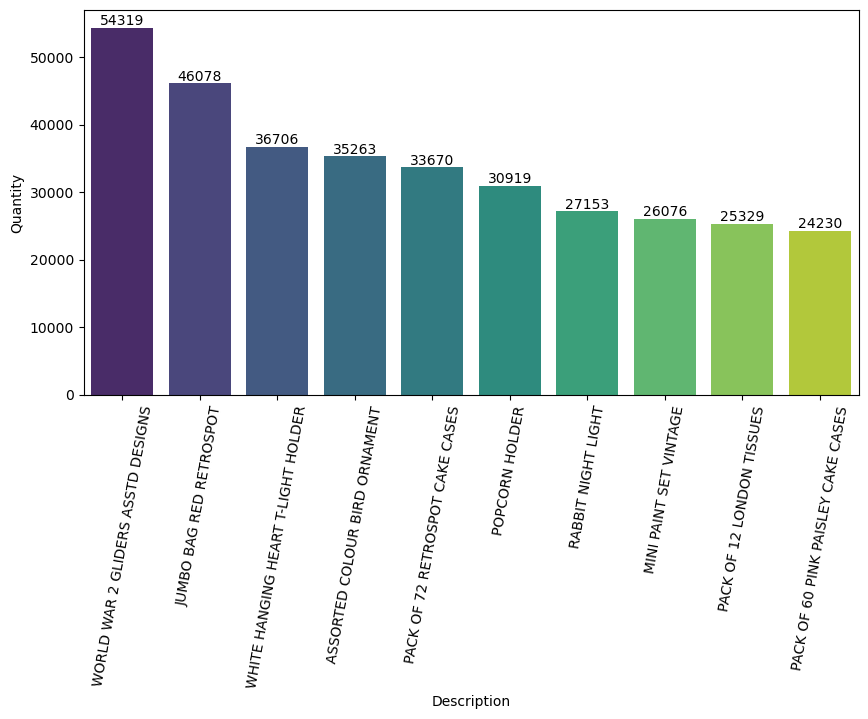

In [53]:
plt.figure(figsize=(10,5))
grf_top_10_ms_prod = sns.barplot(x='Description', y='Quantity', data=top_10_ms_prod, palette='viridis')
for index, quantity in enumerate(top_10_ms_prod['Quantity']):
    plt.text(index, quantity,round(quantity, 2),ha='center', va = 'bottom')
plt.xticks(rotation=80)
plt.show()


## Valor de venda total por mês

In [54]:
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

In [55]:
sales_by_date = df.groupby(df['InvoiceDate'].dt.month)['preco_total'].sum().reset_index()

In [56]:
sales_by_date['preco_total'] = sales_by_date['preco_total'].astype(int)
sales_by_date.dtypes

InvoiceDate    int32
preco_total    int64
dtype: object

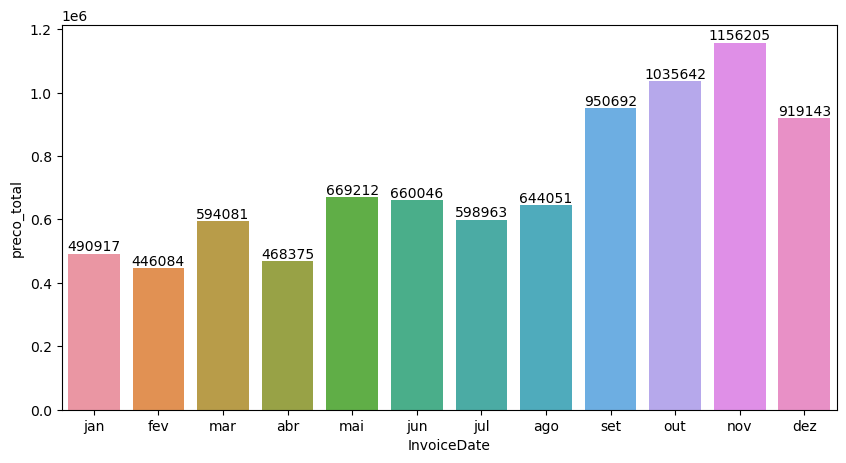

In [57]:
plt.figure(figsize=(10,5))
grf_sales_by_month = sns.barplot(x='InvoiceDate',y='preco_total', data=sales_by_date)
for index, price in enumerate(sales_by_date['preco_total']):
    plt.text(index, price, round(price,1),ha='center',va='bottom')
    plt.xticks(ticks= sales_by_date.index ,labels= ['jan','fev','mar','abr','mai','jun','jul','ago','set','out','nov','dez'])

plt.show()

## Valor total de vendas por pais e por mês

In [58]:
sales_by_date_country = df.groupby([df['InvoiceDate'].dt.month_name(),'Country'])['preco_total'].sum().reset_index()

In [59]:
sales_by_date_country

,InvoiceDate,Country,preco_total
0,April,Australia,771.60
1,April,Austria,680.78
2,April,Belgium,1989.48
3,April,Brazil,1143.60
4,April,Channel Islands,293.00
...,...,...,...
266,September,Spain,5189.24
267,September,Sweden,4575.21
268,September,Switzerland,8284.86
269,September,United Arab Emirates,1013.04


In [60]:
top_sales_by_date_country = sales_by_date_country.nlargest(10,'preco_total')

In [61]:
top_sales_by_date_country2 = sales_by_date_country.nlargest(15,'preco_total')

In [62]:
top_sales_by_date_country2

,InvoiceDate,Country,preco_total
225,November,United Kingdom,975251.39
250,October,United Kingdom,821220.13
70,December,United Kingdom,799389.56
270,September,United Kingdom,794808.69
203,May,United Kingdom,542216.60
161,June,United Kingdom,523775.59
45,August,United Kingdom,497194.91
137,July,United Kingdom,484546.59
184,March,United Kingdom,465784.19
22,April,United Kingdom,408734.11


In [63]:
top_sales_by_date_country.columns.to_list()

['InvoiceDate', 'Country', 'preco_total']

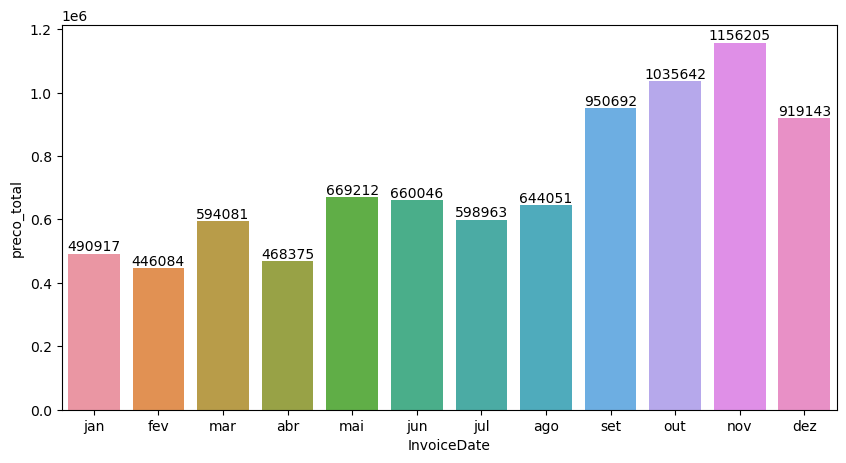

In [64]:
plt.figure(figsize=(10,5))
grf_sales_by_month = sns.barplot(x='InvoiceDate',y='preco_total', data=sales_by_date)
for index, price in enumerate(sales_by_date['preco_total']):
    plt.text(index, price, round(price,1),ha='center',va='bottom')
    plt.xticks(ticks= sales_by_date.index ,labels= ['jan','fev','mar','abr','mai','jun','jul','ago','set','out','nov','dez'])

plt.show()

In [65]:
top_sales_by_date_country

,InvoiceDate,Country,preco_total
225,November,United Kingdom,975251.39
250,October,United Kingdom,821220.13
70,December,United Kingdom,799389.56
270,September,United Kingdom,794808.69
203,May,United Kingdom,542216.60
161,June,United Kingdom,523775.59
45,August,United Kingdom,497194.91
137,July,United Kingdom,484546.59
184,March,United Kingdom,465784.19
22,April,United Kingdom,408734.11


In [66]:
top_sales_by_date_country.iterrows()

<generator object DataFrame.iterrows at 0x7b0638977560>

In [67]:
top_sales_by_date_country.dtypes

InvoiceDate     object
Country         object
preco_total    float64
dtype: object

In [68]:
fig = px.bar(top_sales_by_date_country2,x= 'InvoiceDate', y='preco_total', color='Country')
fig.show()

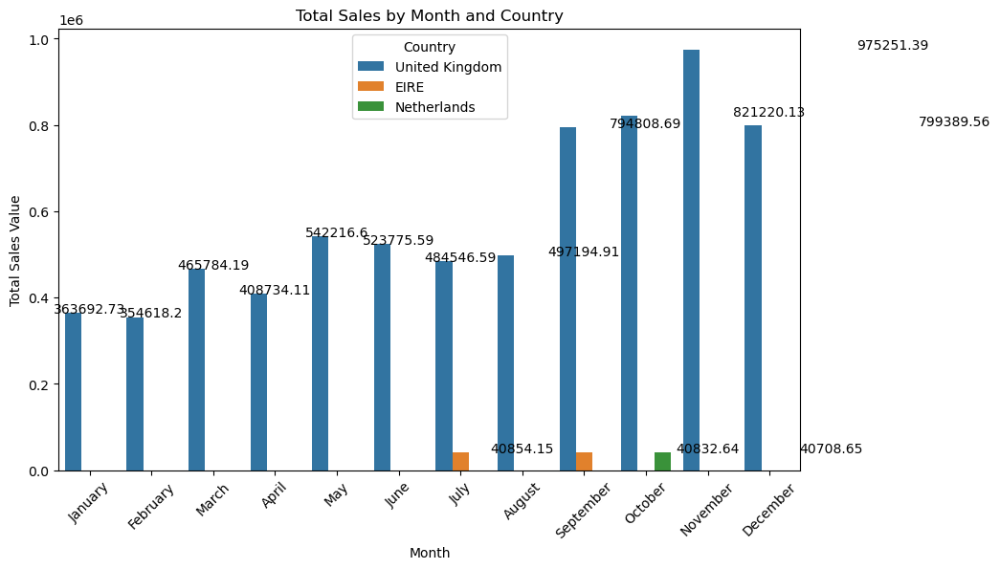

In [69]:
dft = top_sales_by_date_country2
# Convert 'InvoiceDate' to a categorical type with a specific order
month_order = ['January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December']
dft['InvoiceDate'] = pd.Categorical(dft['InvoiceDate'], categories=month_order, ordered=True)


# Sort DataFrame by 'InvoiceDate'
dt = dft.sort_values('InvoiceDate')

# Plot using Seaborn
plt.figure(figsize=(10, 6))
sns.barplot(x='InvoiceDate', y='preco_total', hue='Country', data=dt)
for index,row in enumerate(dt.iterrows()):
    plt.text(index, row[1]['preco_total'],round(row[1]['preco_total'], 2),ha='center', va ='baseline', ma = 'center')
    #plt.xticks(ticks=top_sales_by_date_country.index, labels= top_sales_by_date_country['InvoiceDate'].dt.month_name())
    #plt.xticks(ticks= index ,labels= dt['InvoiceDate'])
plt.xlabel('Month')
plt.ylabel('Total Sales Value')
plt.title('Total Sales by Month and Country')
plt.xticks(rotation=45)
plt.show()

In [70]:
df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,preco_total
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850,United Kingdom,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850,United Kingdom,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850,United Kingdom,20.34
...,...,...,...,...,...,...,...,...,...
541904,581587,22613,PACK OF 20 SPACEBOY NAPKINS,12,2011-12-09 12:50:00,0.85,12680,France,10.20
541905,581587,22899,CHILDREN'S APRON DOLLY GIRL,6,2011-12-09 12:50:00,2.10,12680,France,12.60
541906,581587,23254,CHILDRENS CUTLERY DOLLY GIRL,4,2011-12-09 12:50:00,4.15,12680,France,16.60
541907,581587,23255,CHILDRENS CUTLERY CIRCUS PARADE,4,2011-12-09 12:50:00,4.15,12680,France,16.60


In [71]:
data_ultima_compra

Timestamp('2011-12-09 12:50:00')

In [72]:
filter = df[df['InvoiceNo'] == '537626']
filter['preco_total'].sum()


711.79

In [73]:
df.columns.tolist

<bound method IndexOpsMixin.tolist of Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'preco_total'],
      dtype='object')>

In [74]:
rfm = df.groupby([df['CustomerID'],'InvoiceNo','InvoiceDate'])['preco_total'].sum().reset_index()
nrfm = rfm.groupby(rfm['CustomerID'],)['preco_total'].sum().reset_index()
nrfm

,CustomerID,preco_total
0,12347,4310.00
1,12348,1797.24
2,12349,1757.55
3,12350,334.40
4,12352,2506.04
...,...,...
4332,18280,180.60
4333,18281,80.82
4334,18282,178.05
4335,18283,2045.53


In [75]:
def calc_recency(row):
    return data_ultima_compra - row['InvoiceDate']

def calc_frequency(row):
    return 


In [76]:
nrfm['R'] = rfm.apply(calc_recency,axis=1)

In [77]:
rfm

,CustomerID,InvoiceNo,InvoiceDate,preco_total
0,12347,537626,2010-12-07 14:57:00,711.79
1,12347,542237,2011-01-26 14:30:00,475.39
2,12347,549222,2011-04-07 10:43:00,636.25
3,12347,556201,2011-06-09 13:01:00,382.52
4,12347,562032,2011-08-02 08:48:00,584.91
...,...,...,...,...
18554,18283,579673,2011-11-30 12:59:00,220.31
18555,18283,580872,2011-12-06 12:02:00,208.00
18556,18287,554065,2011-05-22 10:39:00,765.28
18557,18287,570715,2011-10-12 10:23:00,1001.32


In [78]:
frequency = df['InvoiceNo'].groupby(df['CustomerID']).count().reset_index()['InvoiceNo']

In [79]:
ticket = df.groupby(df['CustomerID'])['UnitPrice'].mean().reset_index()
ticket.rename(columns={'UnitPrice':'mean_ticket'}, inplace=True)

In [80]:
ticket

,CustomerID,mean_ticket
0,12347,2.644011
1,12348,5.764839
2,12349,8.289041
3,12350,3.841176
4,12352,15.930706
...,...,...
4332,18280,4.765000
4333,18281,5.622857
4334,18282,5.199167
4335,18283,1.628752


In [81]:
frequency = pd.DataFrame(frequency)
frequency

,InvoiceNo
0,182
1,31
2,73
3,17
4,85
...,...
4332,10
4333,7
4334,12
4335,721


In [82]:
nrfm['F'] = frequency['InvoiceNo']

In [83]:
nrfm['MT'] = ticket['mean_ticket']

## Dataframe de RFM definido

In [84]:
nrfm

,CustomerID,preco_total,R,F,MT
0,12347,4310.00,366 days 21:53:00,182,2.644011
1,12348,1797.24,316 days 22:20:00,31,5.764839
2,12349,1757.55,246 days 02:07:00,73,8.289041
3,12350,334.40,182 days 23:49:00,17,3.841176
4,12352,2506.04,129 days 04:02:00,85,15.930706
...,...,...,...,...,...
4332,18280,180.60,308 days 03:51:00,10,4.765000
4333,18281,80.82,289 days 23:59:00,7,5.622857
4334,18282,178.05,289 days 23:57:00,12,5.199167
4335,18283,2045.53,289 days 00:09:00,721,1.628752


In [85]:
nrfm.to_csv('processedRFMdataset')

In [205]:
df['Country'].values

array(['United Kingdom', 'United Kingdom', 'United Kingdom', ...,
       'France', 'France', 'France'], dtype=object)

In [98]:
df['InvoiceDate'][0]

Timestamp('2010-12-01 08:26:00')

In [167]:
df_frequency = df.drop(columns=['Description'])

In [168]:
distinct_customer_id = df.query("CustomerID == CustomerID")["CustomerID"].unique()

In [169]:
len(distinct_customer_id)

4337

In [198]:
df_gp_cl_id = df.groupby('CustomerID')['InvoiceDate'].apply(list).reset_index().values.tolist()

In [199]:
df_gp_cl_id

[[12347,
  [Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:5

In [200]:
df_gp_cl_id[0][1]

[Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-07 14:57:00'),
 Timestamp('2010-12-

In [201]:
df_gp_cl_id

[[12347,
  [Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:57:00'),
   Timestamp('2010-12-07 14:5

In [202]:
spaces_of_time = []
n = 0 
for customer_id, dates in df_gp_cl_id:
    spaces_of_time.append([])
    for i in range(len(dates) - 1):
        if dates[i + 1].date() != dates[i].date():
            diff = dates[i + 1] - dates[i]
            spaces_of_time[-1].append(diff)
    
print(len(spaces_of_time))
print(spaces_of_time)


4337
[[Timedelta('49 days 23:33:00'), Timedelta('70 days 20:13:00'), Timedelta('63 days 02:18:00'), Timedelta('53 days 19:47:00'), Timedelta('90 days 03:37:00'), Timedelta('37 days 03:27:00')], [Timedelta('39 days 15:33:00'), Timedelta('70 days 00:05:00'), Timedelta('173 days 02:26:00')], [], [], [Timedelta('13 days 02:24:00'), Timedelta('16 days 00:08:00'), Timedelta('5 days 00:08:00'), Timedelta('181 days 22:26:00'), Timedelta('8 days 00:24:00'), Timedelta('35 days 23:39:00')], [], [], [], [Timedelta('80 days 02:43:00'), Timedelta('222 days 20:07:00')], [], [Timedelta('149 days 00:22:00')], [Timedelta('26 days 02:08:00'), Timedelta('115 days 21:35:00'), Timedelta('132 days 00:21:00')], [Timedelta('88 days 00:27:00'), Timedelta('60 days 05:12:00')], [], [Timedelta('69 days 22:42:00'), Timedelta('70 days 03:20:00'), Timedelta('35 days 02:30:00'), Timedelta('47 days 21:02:00'), Timedelta('13 days 02:29:00'), Timedelta('14 days 23:14:00'), Timedelta('1 days 20:23:00'), Timedelta('6 days 

In [203]:
len(spaces_of_time)

4337

In [205]:
df_gp_cl_id = pd.DataFrame(df_gp_cl_id)

In [206]:
df_gp_cl_id['frequency'] = spaces_of_time

In [207]:
df_gp_cl_id[1][0][0].date()

datetime.date(2010, 12, 7)

In [208]:
df_gp_cl_id

,0,1,frequency
0,12347,"[2010-12-07 14:57:00, 2010-12-07 14:57:00, 201...","[49 days 23:33:00, 70 days 20:13:00, 63 days 0..."
1,12348,"[2010-12-16 19:09:00, 2010-12-16 19:09:00, 201...","[39 days 15:33:00, 70 days 00:05:00, 173 days ..."
2,12349,"[2011-11-21 09:51:00, 2011-11-21 09:51:00, 201...",[]
3,12350,"[2011-02-02 16:01:00, 2011-02-02 16:01:00, 201...",[]
4,12352,"[2011-02-16 12:33:00, 2011-02-16 12:33:00, 201...","[13 days 02:24:00, 16 days 00:08:00, 5 days 00..."
...,...,...,...
4332,18280,"[2011-03-07 09:52:00, 2011-03-07 09:52:00, 201...",[]
4333,18281,"[2011-06-12 10:53:00, 2011-06-12 10:53:00, 201...",[]
4334,18282,"[2011-08-05 13:35:00, 2011-08-05 13:35:00, 201...",[118 days 22:08:00]
4335,18283,"[2011-01-06 14:14:00, 2011-01-06 14:14:00, 201...","[17 days 00:44:00, 35 days 19:32:00, 52 days 0..."


In [186]:
spaces_of_time = pd.DataFrame(spaces_of_time)

In [194]:
spaces_of_time.values[0]

array([4318380000000000, 6120780000000000, 5451480000000000,
       4650420000000000, 7789020000000000, 3209220000000000,
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',            'NaT',            'NaT',
                  'NaT',

In [235]:
df_gp_cl_id


,0,1,frequency,median_frequency
0,12346.0,"[2011-01-18 10:01:00, 2011-01-18 10:17:00]",[],0 days 00:00:00
1,12347.0,"[2010-12-07 14:57:00, 2010-12-07 14:57:00, 201...","[49 days 23:33:00, 70 days 20:13:00, 63 days 0...",60 days 20:09:10
2,12348.0,"[2010-12-16 19:09:00, 2010-12-16 19:09:00, 201...","[39 days 15:33:00, 70 days 00:05:00, 173 days ...",94 days 06:01:20
3,12349.0,"[2011-11-21 09:51:00, 2011-11-21 09:51:00, 201...",[],0 days 00:00:00
4,12350.0,"[2011-02-02 16:01:00, 2011-02-02 16:01:00, 201...",[],0 days 00:00:00
...,...,...,...,...
4367,18280.0,"[2011-03-07 09:52:00, 2011-03-07 09:52:00, 201...",[],0 days 00:00:00
4368,18281.0,"[2011-06-12 10:53:00, 2011-06-12 10:53:00, 201...",[],0 days 00:00:00
4369,18282.0,"[2011-08-05 13:35:00, 2011-08-05 13:35:00, 201...","[4 days 01:35:00, 114 days 20:33:00]",59 days 11:04:00
4370,18283.0,"[2011-01-06 14:14:00, 2011-01-06 14:14:00, 201...","[17 days 00:44:00, 35 days 19:32:00, 52 days 0...",25 days 16:24:36.923076923


In [209]:
df_gp_cl_id['median_frequency'] = df_gp_cl_id['frequency'].apply(
    lambda x: pd.Timedelta(pd.Series(x).median()) if x else pd.Timedelta(0)
)

In [210]:
df_gp_cl_id


,0,1,frequency,median_frequency
0,12347,"[2010-12-07 14:57:00, 2010-12-07 14:57:00, 201...","[49 days 23:33:00, 70 days 20:13:00, 63 days 0...",58 days 11:02:30
1,12348,"[2010-12-16 19:09:00, 2010-12-16 19:09:00, 201...","[39 days 15:33:00, 70 days 00:05:00, 173 days ...",70 days 00:05:00
2,12349,"[2011-11-21 09:51:00, 2011-11-21 09:51:00, 201...",[],0 days 00:00:00
3,12350,"[2011-02-02 16:01:00, 2011-02-02 16:01:00, 201...",[],0 days 00:00:00
4,12352,"[2011-02-16 12:33:00, 2011-02-16 12:33:00, 201...","[13 days 02:24:00, 16 days 00:08:00, 5 days 00...",14 days 13:16:00
...,...,...,...,...
4332,18280,"[2011-03-07 09:52:00, 2011-03-07 09:52:00, 201...",[],0 days 00:00:00
4333,18281,"[2011-06-12 10:53:00, 2011-06-12 10:53:00, 201...",[],0 days 00:00:00
4334,18282,"[2011-08-05 13:35:00, 2011-08-05 13:35:00, 201...",[118 days 22:08:00],118 days 22:08:00
4335,18283,"[2011-01-06 14:14:00, 2011-01-06 14:14:00, 201...","[17 days 00:44:00, 35 days 19:32:00, 52 days 0...",20 days 17:40:00


In [220]:
from datetime import datetime

df_gp_cl_id = df.groupby('CustomerID')['InvoiceDate'].apply(list).reset_index().values.tolist()
diferencas = []
# Calcular as diferenças entre datas consecutivas
for customer_id, dates in df_gp_cl_id:
    diferencas.append([])
    for i in range(len(dates) - 1):
        diff = (dates[i + 1] - dates[i]).days
        diferencas[-1].append(diff)

diferencas

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  49,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  70,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  63,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  53,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  90,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  37,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 [0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  39,
  

In [227]:
diferencas1 = pd.DataFrame(diferencas)
diferencas1.describe()

,0,1,2,3,4,5,6,7,8,9,...,7665,7666,7667,7668,7669,7670,7671,7672,7673,7674
count,4267.000000,4212.000000,4159.000000,4111.000000,4039.000000,3966.000000,3899.000000,3828.000000,3756.000000,3678.000000,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,1.841575,1.563390,1.985814,1.421065,2.377321,1.520676,2.204924,2.334117,2.486155,2.246058,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,17.552125,15.313909,17.682629,14.108548,18.964951,14.664158,18.296411,18.402744,20.160252,18.492494,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,309.000000,349.000000,364.000000,350.000000,340.000000,364.000000,343.000000,315.000000,354.000000,347.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Tempo médio que um cliente fica sem comprar

In [212]:
df_gp_cl_id['median_frequency'].mean()

Timedelta('48 days 02:08:57.502882177')

In [231]:
for i in df_gp_cl_id['frequency']:
                for j in range(len(i)-1):
                        if len(i) > 0:
                                a = i[j]+i[j+1]
                        print(a)
                        print(len(i))

120 days 19:46:00
6
133 days 22:31:00
6
116 days 22:05:00
6
143 days 23:24:00
6
127 days 07:04:00
6
109 days 15:38:00
3
243 days 02:31:00
3
29 days 02:32:00
6
21 days 00:15:00
6
186 days 22:33:00
6
189 days 22:50:00
6
44 days 00:03:00
6
302 days 22:50:00
2
91 days 00:55:00
5
115 days 21:35:00
5
182 days 23:09:00
5
181 days 22:55:00
5
148 days 05:39:00
2
69 days 22:42:00
12
132 days 23:27:00
12
105 days 05:50:00
12
42 days 22:06:00
12
47 days 21:02:00
12
53 days 03:55:00
12
28 days 01:43:00
12
16 days 19:37:00
12
8 days 19:20:00
12
31 days 04:45:00
12
32 days 06:33:00
12
72 days 00:19:00
3
70 days 18:15:00
3
85 days 23:50:00
3
306 days 05:13:00
3
224 days 23:26:00
2
95 days 21:04:00
2
88 days 17:37:00
2
129 days 01:50:00
4
31 days 22:32:00
4
34 days 23:48:00
4
60 days 05:48:00
5
41 days 18:20:00
5
25 days 21:51:00
5
54 days 01:14:00
5
28 days 00:08:00
5
60 days 18:31:00
5
85 days 23:34:00
5
85 days 23:21:00
5
92 days 21:16:00
2
51 days 04:35:00
5
156 days 23:29:00
5
199 days 19:43:00
5


In [139]:
import pandas as pd
from datetime import datetime

# Exemplo de DataFrame
data = {
    'CustomerID': [12346.0, 12346.0, 12347.0, 12347.0, 12348.0, 12348.0],
    'InvoiceDate': ['1/18/2011 10:01', '1/18/2011 10:17', '12/7/2010 14:57', '12/7/2010 14:57', '12/16/2010 19:09', '12/16/2010 19:09']
}
df = pd.DataFrame(data)

# Converter strings de data para objetos datetime
df['InvoiceDate'] = pd.to_datetime(df['InvoiceDate'])

# Agrupar por CustomerID e coletar apenas as datas
df_gp_cl_id = df.groupby('CustomerID')['InvoiceDate'].apply(list).reset_index().values.tolist()

# Calcular as diferenças entre datas consecutivas
for customer_id, dates in df_gp_cl_id:
    print(f"CustomerID: {customer_id}")
    for i in range(len(dates) - 1):
        diff = dates[i + 1] - dates[i]
        print(f"Difference between {dates[i]} and {dates[i + 1]}: {diff}")

CustomerID: 12346.0
Difference between 2011-01-18 10:01:00 and 2011-01-18 10:17:00: 0 days 00:16:00
CustomerID: 12347.0
Difference between 2010-12-07 14:57:00 and 2010-12-07 14:57:00: 0 days 00:00:00
CustomerID: 12348.0
Difference between 2010-12-16 19:09:00 and 2010-12-16 19:09:00: 0 days 00:00:00


In [ ]:
for i in distinct_customer_id:
    f = df['InvoiceDate']

In [68]:
from  itertools import count

In [77]:
def countable(n, function= count):
    number = count(start=n,step=3)
    print(number)


In [78]:
countable(10)

count(10, 3)


In [80]:
import pandas as pd
from datetime import datetime

# Vamos criar um DataFrame de exemplo
data = {'datas': ['2024-05-30', '2024-05-31', '2024-06-01']}
df = pd.DataFrame(data)

# Convertendo a coluna 'datas' para o tipo datetime
df['datas'] = pd.to_datetime(df['datas'])

# Data de referência
data_referencia = datetime(2024, 5, 30)

# Calculando a diferença em dias entre cada data e a data de referência
df['diferenca_em_dias'] = (df['datas'] - data_referencia).dt.days

print(df)

       datas  diferenca_em_dias
0 2024-05-30                  0
1 2024-05-31                  1
2 2024-06-01                  2


In [11]:
def minha_funcao():
    print("qualquer coisa")

In [12]:
minha_funcao()

qualquer coisa


In [13]:
canil = [1,2,3]
for cachorro in  canil:
    print(cachorro)

1
2
3


In [9]:
def carro():
    print("andando")

In [10]:
carro()

andando


In [214]:
lista = []
h = 1
for i in range(10):
    lista.append([h])
    h += h
lista

[[1], [2], [4], [8], [16], [32], [64], [128], [256], [512]]